In [27]:
import numpy as np
import xarray as xr
import xrft
import gsw
import os.path as op
import dask.array.fft as fft
from dask.diagnostics import ProgressBar
from oceanmodes import instability_analysis_from_N2_profile as insta
from oceanmodes import neutral_modes_from_N2_profile as neu
from scipy.interpolate import PchipInterpolator as pchip
from xmitgcm import open_mdsdataset
from xgcm.grid import Grid
import matplotlib.ticker as tick
import matplotlib.pyplot as plt
import matplotlib.colors as clr
%matplotlib inline

In [28]:
ddir = '/swot/SUM02/takaya/channelMOC-Darwin/'

In [29]:
ys, dy = (0,60/360)
dt = 5e1
# df = 288
# ts = int(360*86400*1/5e1 + 360*86400*1/10e1)
ts = int(4*360*86400/5e1)
te = int(ts+360*86400*dy/dt)
print(ts,te,int(ts+360*86400*(1/360)/dt))

2488320 2592000 2490048


In [14]:
ts+360*86400*(135/360)/dt
360*86400*1/5e1 + 360*86400*(180/360)/10e1

777600.0

In [20]:
iternum = np.append(np.append(np.arange(0,25920,int(1728*15)),np.arange(25920,360*86400*1/5e1,int(1728*15))),
                    np.arange(360*86400/5e1,360*86400/5e1+360*86400*3/10e1,int(864*15)))
iternum

array([      0.,   25920.,   51840.,   77760.,  103680.,  129600.,
        155520.,  181440.,  207360.,  233280.,  259200.,  285120.,
        311040.,  336960.,  362880.,  388800.,  414720.,  440640.,
        466560.,  492480.,  518400.,  544320.,  570240.,  596160.,
        622080.,  635040.,  648000.,  660960.,  673920.,  686880.,
        699840.,  712800.,  725760.,  738720.,  751680.,  764640.,
        777600.,  790560.,  803520.,  816480.,  829440.,  842400.,
        855360.,  868320.,  881280.,  894240.,  907200.,  920160.,
        933120.,  946080.,  959040.,  972000.,  984960.,  997920.,
       1010880., 1023840., 1036800., 1049760., 1062720., 1075680.,
       1088640., 1101600., 1114560., 1127520., 1140480., 1153440.,
       1166400., 1179360., 1192320., 1205280., 1218240., 1231200.,
       1244160., 1257120., 1270080., 1283040., 1296000., 1308960.,
       1321920., 1334880., 1347840., 1360800., 1373760., 1386720.,
       1399680., 1412640., 1425600., 1438560., 1451520., 14644

In [21]:
dsdef = open_mdsdataset(op.join(ddir,'02km_momDefOutput'), 
                       grid_dir=op.join(ddir,'02km_grid'),
                       iters=range(ts,te)
#                        iters=iternum, 
                       prefix=['U','V','W'], delta_t=dt
                       )
dsdef

/home/takaya/xmitgcm/xmitgcm/mds_store.py:124: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if iters == 'all':
/home/takaya/xmitgcm/xmitgcm/mds_store.py:721: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM02/takaya/channelMOC-Darwin/02km_momDefOutput. Using default version.
  "in %s. Using default version." % data_dir)
/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 96)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * YG       (YG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 -16.1 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC) 

In [4]:
dsyr3 = open_mdsdataset(op.join(ddir,'02km_momDefOutput'), 
                      grid_dir=op.join(ddir,'02km_grid'),
                      iters=range(ts,te,int(864*15)), 
                      prefix=['U','V','W','PH'], delta_t=dt
                      ).sel(YC=slice(5.9e5,14.1e5),YG=slice(5.9e5,14.1e5))
dsyr3

/home/takaya/xmitgcm/xmitgcm/mds_store.py:721: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM02/takaya/channelMOC-Darwin/02km_momDefOutput. Using default version.
  "in %s. Using default version." % data_dir)
/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 410, YG: 411, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 24)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * YG       (YG) >f4 590000.0 592000.0 594000.0 596000.0 598000.0 600000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 -16.1 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(410, 500), chunksize=(410, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(411, 500), chunksize=(411, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(410, 500), chunksize=(410, 500)>
    Depth    (YC, XC)

In [9]:
itermon = np.append(np.arange(51840,622080,51840),np.arange(622080,te+25920,25920))
dsmon = open_mdsdataset(op.join(ddir,'02km_taveDef'), 
                       grid_dir=op.join(ddir,'02km_grid'),
                       iters=itermon, 
                       prefix=['uVeltave','vVeltave','wVeltave'], delta_t=dt
                       )
dsmon

/home/takaya/xmitgcm/xmitgcm/mds_store.py:124: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if iters == 'all':
/home/takaya/xmitgcm/xmitgcm/mds_store.py:721: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM02/takaya/channelMOC-Darwin/02km_taveDef. Using default version.
  "in %s. Using default version." % data_dir)
/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:   (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 48)
Coordinates:
  * XC        (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC        (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG        (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * YG        (YG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z         (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1       (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu        (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zl        (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA        (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG       (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG       (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth     (Y

In [24]:
dsdef.coords['month'] = ('time',np.tile(np.repeat(range(12),2),4))
dsmon.coords['month'] = ('time',np.tile(range(12),4))
Up = dsdef.U.groupby('month') - dsmon.uVeltave.groupby('month').mean(['time','XG'])
Vp = dsdef.V.groupby('month') - dsmon.vVeltave.groupby('month').mean(['time','XC'])
Up

<xarray.DataArray (time: 96, Z: 76, YC: 1000, XG: 500)>
dask.array<shape=(96, 76, 1000, 500), dtype=float32, chunksize=(1, 76, 1000, 500)>
Coordinates:
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    dyG      (YC, XG) >f4 2000.0 2000.0 2000.0 2000.0 2000.0 2000.0 2000.0 ...
    dxC      (YC, XG) >f4 2000.0 2000.0 2000.0 2000.0 2000.0 2000.0 2000.0 ...
    rAw      (YC, XG) >f4 4000000.0 4000000.0 4000000.0 4000000.0 4000000.0 ...
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 1.93 2.2 2.5 2.84 3.21 3.63 4.1 ...
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 41.05485 56.7018 74.50695 94.7646 ...
    hFacW    (Z, YC, XG) >f4 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    iter     (time) int64 dask.array<shape=(96,), chunksize=(1,)>
  * time     (time) float64 0.0 2.592e+06 5.184e+06 7.776e+06 1.037e+07 ...
 

In [22]:
U = dsdef.U
V = dsdef.V
W = dsdef.W
U

<xarray.DataArray 'U' (time: 96, Z: 76, YC: 1000, XG: 500)>
dask.array<shape=(96, 76, 1000, 500), dtype=float32, chunksize=(1, 76, 1000, 500)>
Coordinates:
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxC      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    rAw      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    hFacW    (Z, YC, XG) >f4 dask.array<shape=(76, 1000, 500), chunksize=(76, 1000, 500)>
    iter     (time) int64 dask.array<shape=(96,), chunksize=(1,)>
  * time     (time) float64 0.0 2.592e+06 5.184e+06 7.776e+06 1.037e+07 ...
Attributes:
    standard_

In [21]:
year2 = len(np.arange(0,360*86400*1/5e1,1728))
Uyr2 = dsdef.U[year2:year2+360]
Vyr2 = dsdef.V[year2:year2+360]
Wyr2 = dsdef.W[year2:year2+360]
Wyr2

<xarray.DataArray 'W' (time: 360, Zl: 76, YC: 1000, XC: 500)>
dask.array<shape=(360, 76, 1000, 500), dtype=float32, chunksize=(1, 76, 1000, 500)>
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    iter     (time) int64 dask.array<shape=(360,), chunksize=(1,)>
  * time     (time) float64 6.221e+07 6.229e+07 6.238e+07 6.247e+07 ...
Attributes:
    standard_name:  sea_water_z_velocity
    long_name:      Vertical Component of Velocity
    units:          m s-1

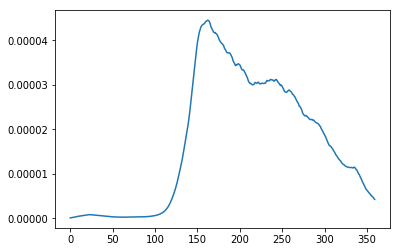

In [17]:
plt.plot((W**2).mean(['Zl','YC','XC']))

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


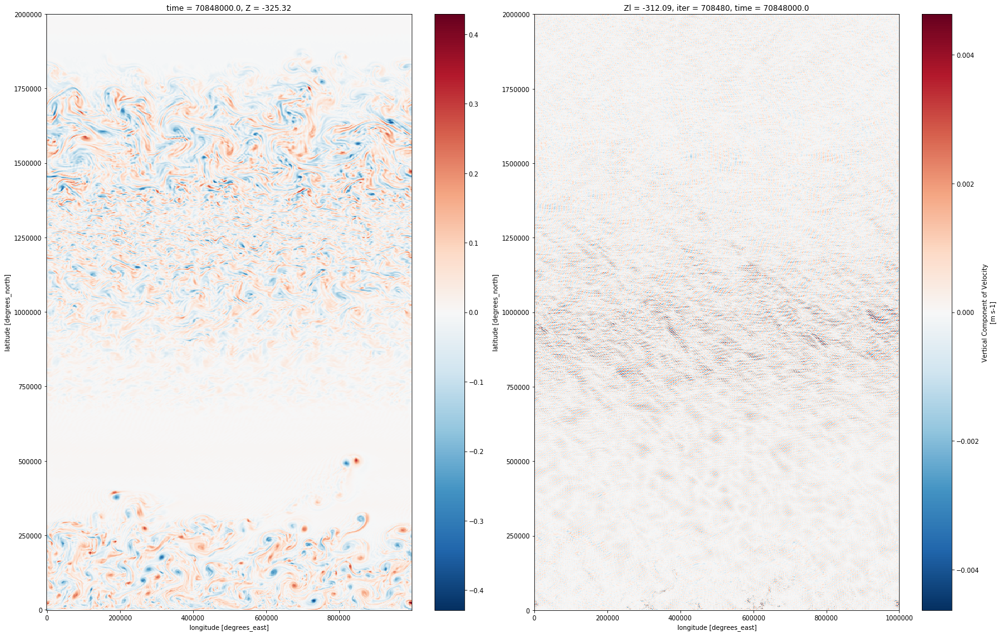

In [52]:
gridef = Grid(dsdef, periodic='X')
zeta = gridef.diff(V,'X')/gridef.diff(V.XC,'X') - gridef.diff(U,'Y',boundary='fill')/gridef.diff(U.YC,'Y',boundary='fill')

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(22,14))
fig.set_tight_layout(True)
(zeta/f0)[100,33].plot(ax=ax1)
W[100,33].plot(ax=ax2)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


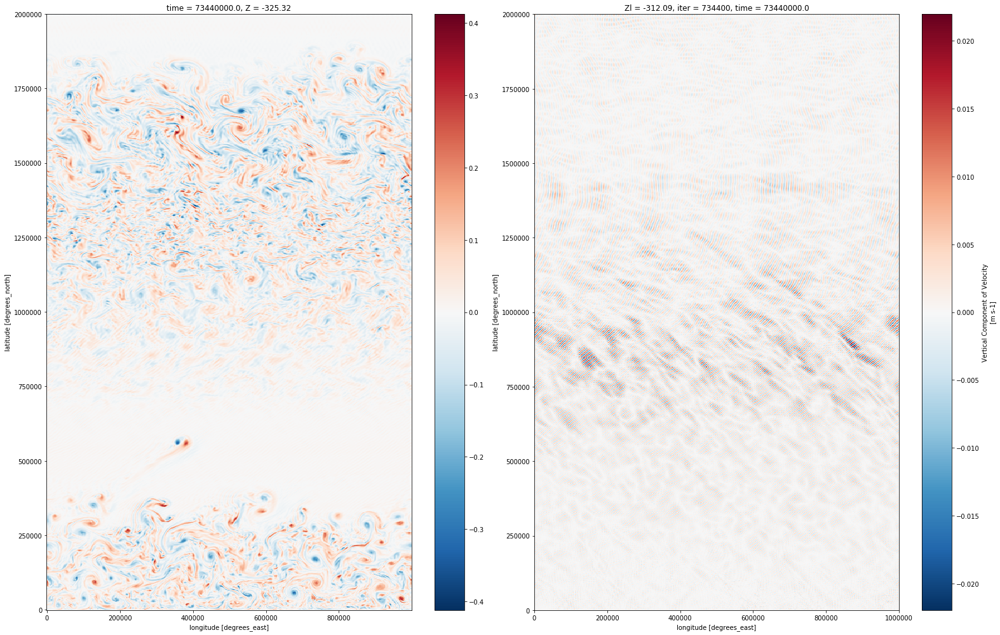

In [53]:
gridef = Grid(dsdef, periodic='X')
zeta = gridef.diff(V,'X')/gridef.diff(V.XC,'X') - gridef.diff(U,'Y',boundary='fill')/gridef.diff(U.YC,'Y',boundary='fill')

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(22,14))
fig.set_tight_layout(True)
(zeta/f0)[130,33].plot(ax=ax1)
W[130,33].plot(ax=ax2)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


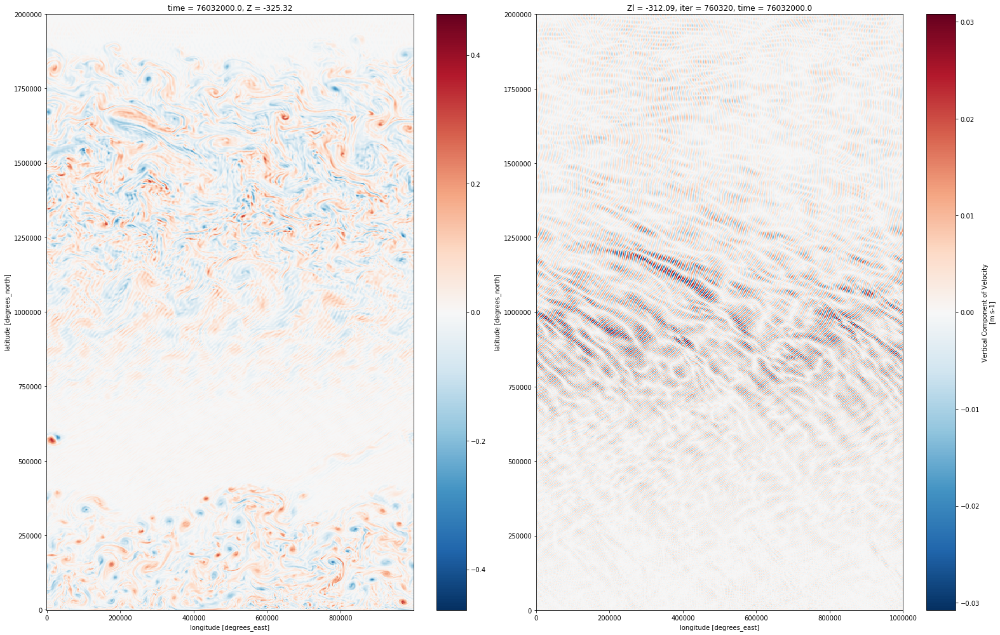

In [28]:
gridef = Grid(dsdef, periodic='X')
zeta = gridef.diff(V,'X')/gridef.diff(V.XC,'X') - gridef.diff(U,'Y',boundary='fill')/gridef.diff(U.YC,'Y',boundary='fill')

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(22,14))
fig.set_tight_layout(True)
(zeta/f0)[160,33].plot(ax=ax1)
W[160,33].plot(ax=ax2)

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 10.4s


/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


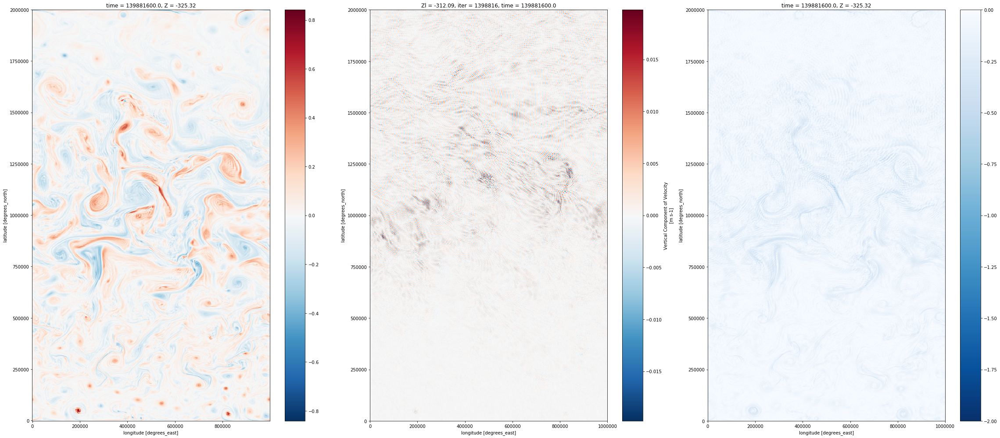

In [37]:
gridef = Grid(dsdef, periodic='X')
zeta = (gridef.diff(dsdef.V,'X')/gridef.diff(dsdef.XC,'X') 
       - gridef.diff(dsdef.U,'Y',boundary='fill')/gridef.diff(dsdef.YC,'Y',boundary='fill'))

uk = xrft.dft(dsdef.U, dim=['XG'], shift=False)
vk = xrft.dft(dsdef.V, dim=['XC'], shift=False)
ux = xr.DataArray(fft.ifft((2j*np.pi*uk*uk.freq_XG).data, axis=-1).real, 
                 dims=dsdef.U.dims, coords=dsdef.U.coords)
vx = xr.DataArray(fft.ifft((2j*np.pi*vk*vk.freq_XC).data, axis=-1).real, 
                 dims=dsdef.V.dims, coords=dsdef.V.coords)
uy = gridef.diff(dsdef.U, 'Y', boundary='fill')/gridef.diff(dsdef.YC, 'Y', boundary='fill')
vy = gridef.diff(dsdef.V, 'Y', boundary='fill')/gridef.diff(dsdef.YG, 'Y', boundary='fill')
with ProgressBar():
    alf = np.sqrt((gridef.interp(ux,'X')[-1] - vy[-1])**2 
                 + (gridef.interp(vx,'Y',boundary='fill')[-1] + gridef.interp(gridef.interp(uy,'X'),
                                                                             'Y',boundary='fill')[-1]
                   )**2
                 ).compute()

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


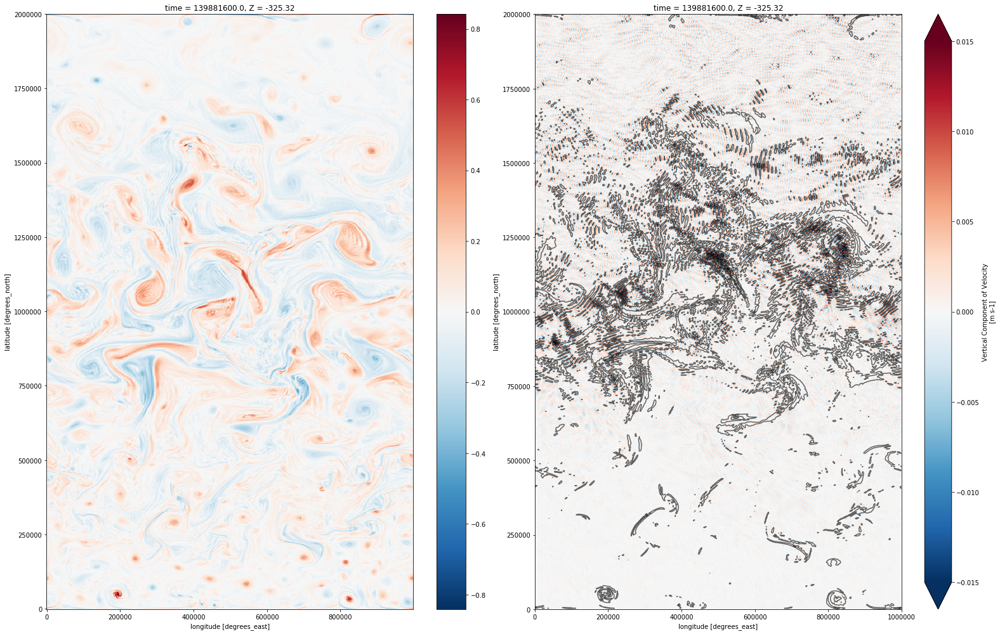

In [50]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(22,14))
fig.set_tight_layout(True)
(zeta/f0)[-1,33].plot(ax=ax1, rasterized=True)
dsdef.W[-1,33].plot(ax=ax2, rasterized=True, vmin=-0.015, vmax=0.015, cmap='RdBu_r')
(alf[33]*f0**-1).plot.contour(ax=ax2, colors='k', alpha=.6, levels=np.linspace(-1,0,8))
plt.savefig(op.join(ddir,'Figures/zeta-W-strain_test.pdf'))

In [73]:
dsyr3.drC.values
# dsyr3.Z
grid3.diff(u, 'Z', boundary='fill')

<xarray.DataArray 'sub-1ab7d59fc34dfa8f0d035e3472e78e8c' (time: 24, Zl: 76, YC: 410, XG: 500)>
dask.array<shape=(24, 76, 410, 500), dtype=float32, chunksize=(1, 1, 410, 500)>
Coordinates:
  * time     (time) float64 9.331e+07 9.461e+07 9.59e+07 9.72e+07 9.85e+07 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...

In [5]:
u = dsyr3.U
v = dsyr3.V
w = dsyr3.W
phi = dsyr3.PH
grid3 = Grid(dsyr3, periodic=['X'])
# b = (grid3.diff(phi,'Z',boundary='fill')/grid3.diff(phi.Z,'Z',boundary='fill'))
uk = xrft.dft(u, dim=['XG'], shift=False)
vk = xrft.dft(v, dim=['XC'], shift=False)
wk = xrft.dft(w, dim=['XC'], shift=False)
pk = xrft.dft(phi, dim=['XC'], shift=False)
ux = xr.DataArray(fft.ifft((2j*np.pi*uk*uk.freq_XG).data, axis=-1).real, 
                 dims=u.dims, coords=u.coords).compute()
vx = xr.DataArray(fft.ifft((2j*np.pi*vk*vk.freq_XC).data, axis=-1).real, 
                 dims=v.dims, coords=v.coords).compute()
px = xr.DataArray(fft.ifft((2j*np.pi*pk*pk.freq_XC).data, axis=-1).real, 
                 dims=phi.dims, coords=phi.coords).compute()
pxx = xr.DataArray(fft.ifft((-4*np.pi**2*pk*pk.freq_XC**2).data, axis=-1).real, 
                  dims=phi.dims, coords=phi.coords).compute()
# bx = xr.DataArray(fft.ifft((2j*np.pi*bk*bk.freq_XC).data, axis=-1).real, 
#                  dims=b.dims, coords=b.coords)

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


In [21]:
uy = grid3.diff(u*dsyr3.dxC,'Y',boundary='fill') / dsyr3.rAz
vy = grid3.diff(v*dsyr3.dxG,'Y',boundary='fill') / dsyr3.rA
py = grid3.diff(phi*grid3.interp(dsyr3.dxG,'Y',boundary='fill'),'Y',boundary='fill') / dsyr3.rAs
pyy = grid3.diff(py*dsyr3.dxG,'Y',boundary='fill') / dsyr3.rA
# wy = grid3.diff(w, 'Y', boundary='fill')/grid3.diff(w.YC, 'Y', boundary='fill')
# by = grid3.diff(b, 'Y', boundary='fill')/grid3.diff(b.YC, 'Y', boundary='fill')
uz = grid3.diff(u,'Z',boundary='fill') / grid3.diff(u.Z,'Z',boundary='fill')
vz = grid3.diff(v,'Z',boundary='fill') / grid3.diff(v.Z,'Z',boundary='fill')
print(uy.dims, vy.dims, py.dims, pyy.dims)

('time', 'Z', 'YG', 'XG') ('time', 'Z', 'YC', 'XC') ('time', 'Z', 'YG', 'XC') ('time', 'Z', 'YC', 'XC')


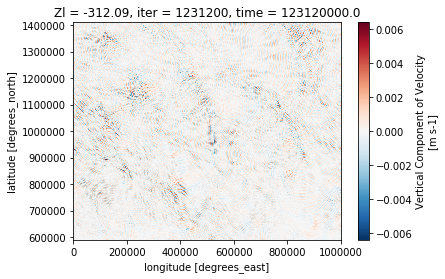

In [63]:
w[-1,33].plot()

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


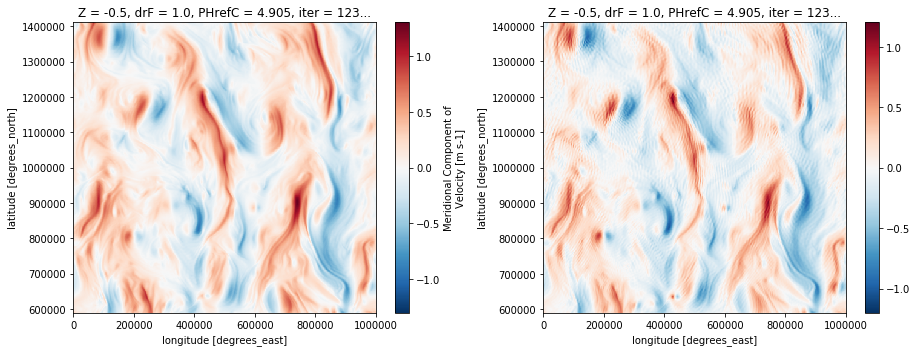

In [24]:
f0 = -1.1e-4
beta = 1.4e-11
fC = f0 + beta*(dsyr3.YC-10e5)

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13,5))
fig.set_tight_layout(True)
v[-1,0].plot(ax=ax1)
(px[-1,0]*fC**-1).plot(ax=ax2)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


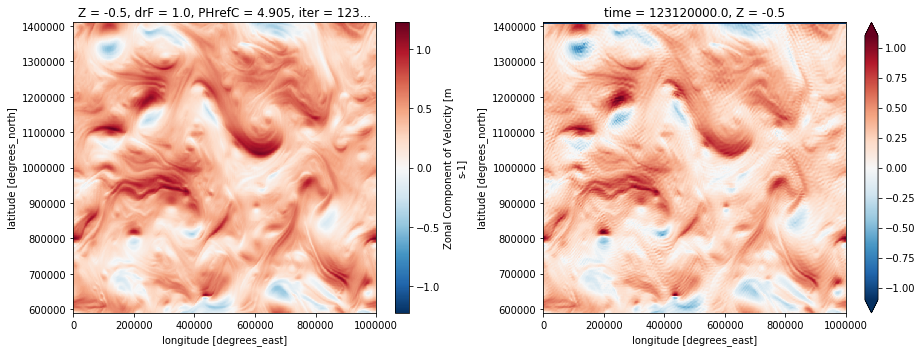

In [28]:
fG = f0 + beta*(dsyr3.YG-10e5)
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(13,5))
fig.set_tight_layout(True)
u[-1,0].plot(ax=ax1)
(-py[-1,0]*fG**-1).plot(ax=ax2, vmax=1.1)

### $$\epsilon_{adv} = 1 - \frac{\big|f\zeta + \nabla\cdot({\bf v}\cdot\nabla{\bf u}) - \rho^{-1}\nabla^2p\big|}{f\big|\zeta\big| + \big|\nabla\cdot({\bf v}\cdot\nabla{\bf u})\big| + \big|\rho^{-1}\nabla^2p\big|\ (+ \mu)}$$

where $\mu = f\zeta_\text{rms} + \rho^{-1}(\nabla^2p)_\text{rms}$.

In [29]:
zeta = grid3.interp(vx,'Y',boundary='fill')-grid3.interp(grid3.interp(uy,'X'),'Y',boundary='fill')
uux = u*ux
vuy = grid3.interp(grid3.interp(v,'X'),'Y',boundary='fill')*grid3.interp(uy,'Y',boundary='fill')
wuz = grid3.interp(grid3.interp(w,'X')*uz,'Z',boundary='fill')
u1 = uux + vuy + wuz
uvx = grid3.interp(grid3.interp(u,'X'),'Y',boundary='fill')*vx
vvy = v*grid3.interp(vy,'Y',boundary='fill')
wvz = grid3.interp(grid3.interp(w,'Y',boundary='fill')*vz,'Z',boundary='fill')
u2 = uvx + vvy + wvz
print(zeta.dims,u1.dims,u2.dims)

('time', 'Z', 'YC', 'XC') ('time', 'Z', 'YC', 'XG') ('time', 'Z', 'YG', 'XC')


In [33]:
u1k = xrft.dft(u1, dim=['XG'], shift=False)
u1x = xr.DataArray(fft.ifft((2j*np.pi*u1k*u1k.freq_XG).data, axis=-1).real, 
                  dims=u1.dims, coords=u1.coords).compute()
u2y = grid3.diff(u2*dsyr3.dxG,'Y',boundary='fill')/dsyr3.rA
ep1 = grid3.interp(u1x,'X') + u2y
ep1

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


<xarray.DataArray (time: 24, Z: 76, YC: 410, XC: 500)>
dask.array<shape=(24, 76, 410, 500), dtype=float64, chunksize=(1, 1, 1, 500)>
Coordinates:
  * time     (time) float64 9.331e+07 9.461e+07 9.59e+07 9.72e+07 9.85e+07 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
    rA       (YC, XC) >f4 dask.array<shape=(410, 500), chunksize=(410, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(410, 500), chunksize=(410, 500)>

In [34]:
ep2 = zeta*fC
ep2

<xarray.DataArray (time: 24, Z: 76, YC: 410, XC: 500)>
dask.array<shape=(24, 76, 410, 500), dtype=float64, chunksize=(1, 76, 1, 500)>
Coordinates:
  * time     (time) float64 9.331e+07 9.461e+07 9.59e+07 9.72e+07 9.85e+07 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...

In [35]:
ep3 = pxx + pyy
ep3

<xarray.DataArray (time: 24, Z: 76, YC: 410, XC: 500)>
dask.array<shape=(24, 76, 410, 500), dtype=float64, chunksize=(1, 76, 1, 500)>
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    rA       (YC, XC) >f4 4000000.0 4000000.0 4000000.0 4000000.0 4000000.0 ...
    Depth    (YC, XC) >f4 2985.0 2985.0 2985.0 2985.0 2985.0 2985.0 2985.0 ...
    drF      (Z) >f4 1.0 1.14 1.3 1.49 1.7 1.93 2.2 2.5 2.84 3.21 3.63 4.1 ...
    PHrefC   (Z) >f4 4.905 15.4017 27.3699 41.05485 56.7018 74.50695 94.7646 ...
    hFacC    (Z, YC, XC) >f4 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 1.0 ...
    iter     (time) int64 933120 946080 959040 972000 984960 997920 1010880 ...
  * time     (time) float64 9.331e+07 9.461e+07 9.59e+07 9.72e+07 9.85e+07 ...

In [36]:
with ProgressBar():
    ep = 1. - (np.abs(ep1+ep2-ep3) * (np.abs(ep1)+np.abs(ep2)+np.abs(ep3))**-1).compute()
ep

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed | 44.4s


<xarray.DataArray (time: 24, Z: 76, YC: 410, XC: 500)>
array([[[[3.281747e-03, ..., 3.749766e-03],
         ...,
         [9.359615e-03, ..., 1.070996e-02]],

        ...,

        [[2.031416e-04, ..., 6.144879e-05],
         ...,
         [7.573086e-05, ..., 9.120446e-05]]],


       ...,


       [[[2.244641e-03, ..., 1.668518e-03],
         ...,
         [9.448576e-03, ..., 8.987065e-03]],

        ...,

        [[0.000000e+00, ..., 0.000000e+00],
         ...,
         [4.245061e-04, ..., 3.818603e-04]]]])
Coordinates:
  * time     (time) float64 9.331e+07 9.461e+07 9.59e+07 9.72e+07 9.85e+07 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * YC       (YC) >f4 591000.0 593000.0 595000.0 597000.0 599000.0 601000.0 ...
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
    rA       (YC, XC) >f4 4000000.0 4000000.0 4000000.0 4000000.0 4000000.0 ...
    Depth    (YC, XC) >f4 2985.0 2985.0 2985.0 2985.0 2985.0 2985.0 2985.0 ...
 

In [37]:
with ProgressBar():
    alf = np.sqrt((grid3.interp(ux,'X')[-1] - vy[-1])**2 
                 + (grid3.interp(vx,'Y',boundary='fill')[-1] + grid3.interp(grid3.interp(uy,'X'),
                                                                           'Y',boundary='fill')[-1]
                   )**2
                 ).compute()
alf

[########################################] | 100% Completed |  1.7s


<xarray.DataArray (Z: 76, YC: 410, XC: 500)>
array([[[2.684565e-05, 2.074626e-05, ..., 3.535598e-05, 3.650836e-05],
        [1.977572e-05, 2.748742e-05, ..., 1.444573e-05, 1.103636e-05],
        ...,
        [1.098949e-05, 2.323866e-05, ..., 2.422614e-05, 1.977716e-05],
        [9.120999e-05, 1.057140e-04, ..., 7.515848e-05, 8.956280e-05]],

       [[2.138779e-05, 1.533535e-05, ..., 3.043702e-05, 3.149748e-05],
        [1.989152e-05, 2.750903e-05, ..., 1.405762e-05, 1.101380e-05],
        ...,
        [1.081978e-05, 2.341278e-05, ..., 2.412325e-05, 1.973202e-05],
        [8.587445e-05, 1.003478e-04, ..., 7.008580e-05, 8.419970e-05]],

       ...,

       [[5.637316e-05, 5.837925e-05, ..., 5.260602e-05, 5.407355e-05],
        [3.815765e-06, 6.065177e-06, ..., 3.772716e-06, 3.192038e-06],
        ...,
        [3.824406e-06, 5.440824e-06, ..., 6.973044e-06, 3.793546e-06],
        [5.202827e-05, 5.238585e-05, ..., 4.919563e-05, 5.075158e-05]],

       [[5.738647e-05, 5.923231e-05, ..., 5.3

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/seaborn-0.9.dev0-py3.6.egg/seaborn/apionly.py:9: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)
/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


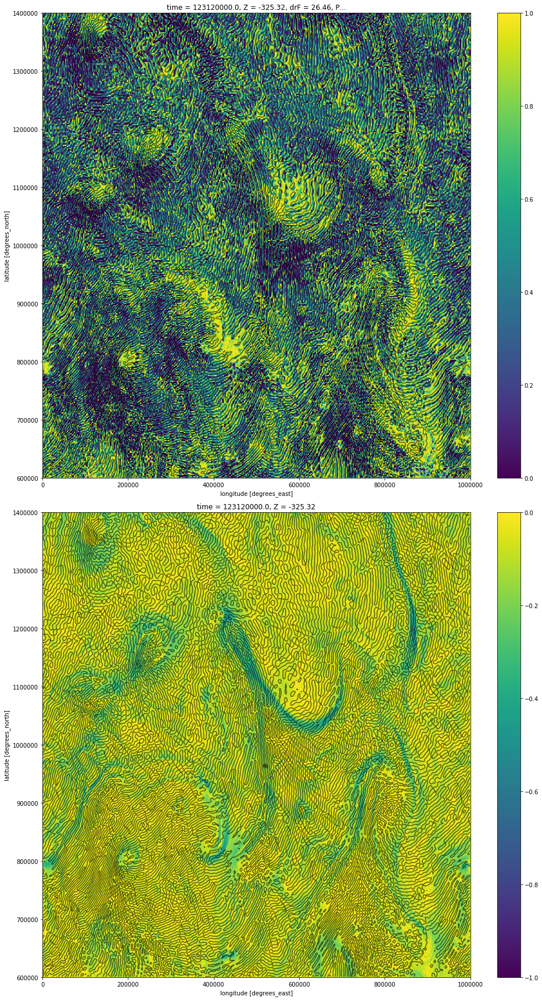

In [38]:
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(14,24))
fig.set_tight_layout(True)
w[-1,33].sel(YC=slice(6e5,14e5)).plot.contour(ax=ax1, colors='k', alpha=.6, vmin=-0.015, vmax=0.015)
ep[-1,33].sel(YC=slice(6e5,14e5)).plot.pcolormesh(ax=ax1, vmin=0., vmax=1., rasterized=True)
w[-1,33].sel(YC=slice(6e5,14e5)).plot.contour(ax=ax2, colors='k', alpha=.6, vmin=-0.015, vmax=0.015)
(alf[33]*fC**-1).sel(YC=slice(6e5,14e5)).plot.pcolormesh(ax=ax2, vmin=-1., vmax=0., rasterized=True)
plt.savefig(op.join(ddir,'Figures/epsilon-strain_test.pdf'))

(0, 1.0)

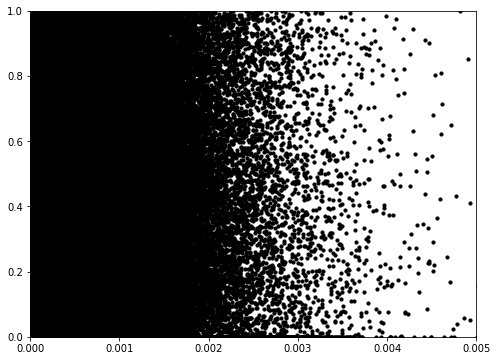

In [60]:
fig, ax = plt.subplots(figsize=(8,6))
ax.scatter(np.abs(w[-1,33]).data.ravel(), ep[-1,33].data.ravel(), s=10., c='k')
ax.set_xlim([0.,0.005])
ax.set_ylim([0,1.])

In [25]:
gridef = Grid(dsdef, periodic='X')
with ProgressBar():
    KE = .5*(gridef.interp(U**2,'X')+gridef.interp(V**2,'Y',boundary='fill')).mean(['Z','YC','XC']).compute()
    EKE = .5*(gridef.interp(Up**2,'X')+gridef.interp(Vp**2,'Y',boundary='fill')).mean(['Z','YC','XC']).compute()
    wKE = .5*(W**2).mean(['Zl','YC','XC']).compute()

[########################################] | 100% Completed |  7min 28.4s
[########################################] | 100% Completed |  5min  8.5s
[########################################] | 100% Completed |  3min 18.1s


In [81]:
EKE

<xarray.DataArray (time: 1080)>
array([0.010994, 0.007654, 0.007462, ..., 0.023673, 0.02383 , 0.023972],
      dtype=float32)
Coordinates:
  * time     (time) float64 0.0 1.728e+05 3.456e+05 5.184e+05 6.912e+05 ...

96


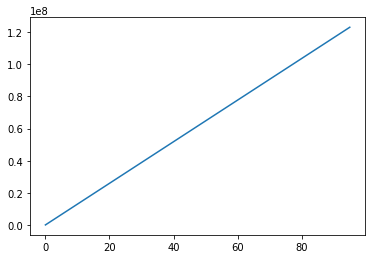

In [15]:
# time = np.arange(0,25920,72)*50
# time = np.append(time,np.arange(25920*50,360*86400*3.5,86400))
time = np.arange(0,360*86400*4,86400*15)
print(len(time))
plt.plot(time)

Text(0,0.5,'[m$^2$ s$^{-2}$]')

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


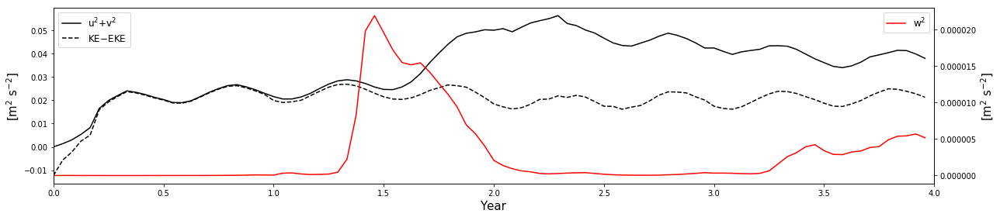

In [17]:
fig, ax = plt.subplots(figsize=(18,4))
fig.set_tight_layout(True)
ax2 = ax.twinx()
ax.plot(time/(360*86400), KE.data, 'k', label=r"u$^2$+v$^2$")
ax.plot(time/(360*86400), (KE-EKE).data, 'k--', label=r"KE$-$EKE")
ax2.plot(time/(360*86400), wKE.data, 'r', label=r"w$^2$")
ax.legend(loc='upper left', fontsize=12)
ax2.legend(loc='upper right', fontsize=12)
ax.set_xlim([0,4])
ax.set_xlabel(r"Year", fontsize=15)
ax.set_ylabel(r"[m$^2$ s$^{-2}$]", fontsize=15)
ax2.set_ylabel(r"[m$^2$ s$^{-2}$]", fontsize=15)

In [30]:
ds1H = open_mdsdataset(op.join(ddir,'02km_snap1H'), 
                      grid_dir=op.join(ddir,'02km_grid'),
                      iters=range(ts,te,72), 
                      prefix=['Wsnap1H'], delta_t=dt
                      )
ds1H

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 1440)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * YG       (YG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 -16.1 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC

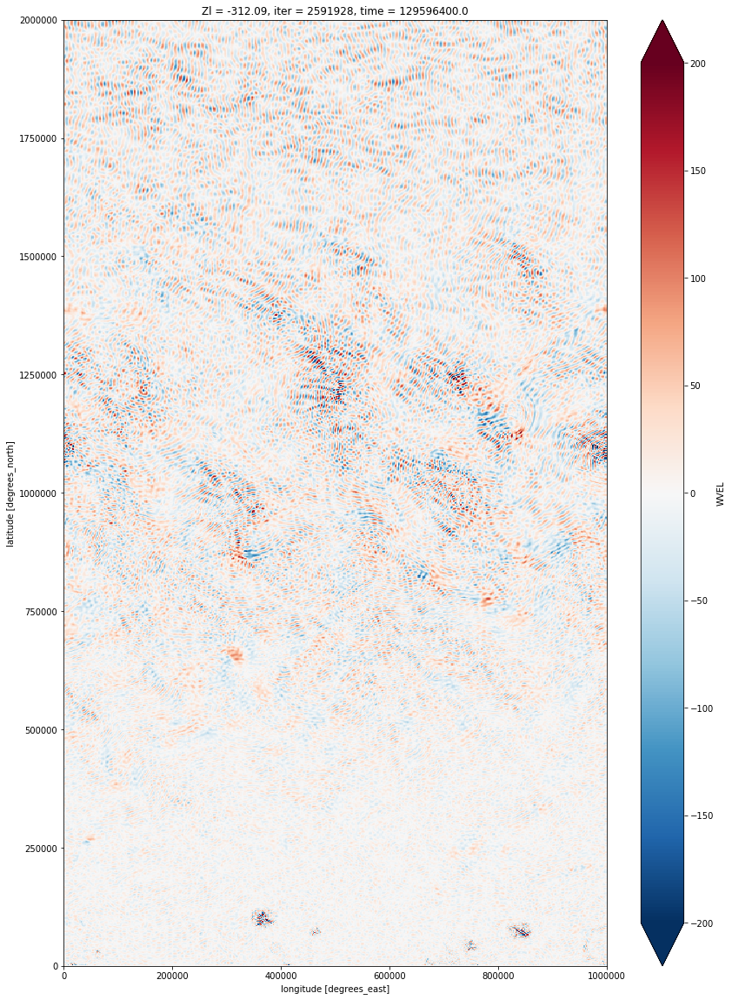

In [35]:
(ds1H.WVEL[-1,33]*86400).plot(figsize=(14,20), vmax=2e2)

In [45]:
with ProgressBar():
    wc300 = ds1H.WVEL[:,33,500,250].load()
wc300

[########################################] | 100% Completed | 18min 25.5s


<xarray.DataArray 'WVEL' (time: 1440)>
array([ 0.00694 , -0.007032,  0.004502, ..., -0.000212,  0.000212,  0.000192],
      dtype=float32)
Coordinates:
    XC       >f4 501000.0
    YC       >f4 1001000.0
    Zl       >f4 -312.09
    rA       float32 4000000.0
    Depth    float32 2985.0
    iter     (time) int64 2488320 2488392 2488464 2488536 2488608 2488680 ...
  * time     (time) float64 1.244e+08 1.244e+08 1.244e+08 1.244e+08 ...
Attributes:
    standard_name:  WVEL
    long_name:      Vertical Component of Velocity (r_units/s)
    units:          m/s

(0, 24)

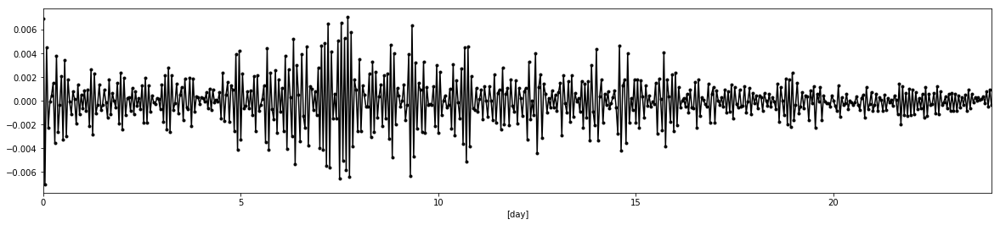

In [46]:
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(((ds1H.time-ds1H.time[0])*86400**-1), wc300, 'k.-')
ax.set_xlabel(r'[day]')
ax.set_xlim([0,24])

In [42]:
ds1H.WVEL[::10]

<xarray.DataArray 'WVEL' (time: 144, Zl: 76, YC: 1000, XC: 500)>
dask.array<shape=(144, 76, 1000, 500), dtype=float32, chunksize=(1, 76, 1000, 500)>
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    iter     (time) int64 dask.array<shape=(144,), chunksize=(1,)>
  * time     (time) float64 1.244e+08 1.245e+08 1.245e+08 1.245e+08 ...
Attributes:
    standard_name:  WVEL
    long_name:      Vertical Component of Velocity (r_units/s)
    units:          m/s

In [3]:
(5.5*86400)**-1

2.1043771043771042e-06

In [50]:
with ProgressBar():
    w45RMS = np.sqrt((ds1H.WVEL[::10]**2).mean(['Zl','YC','XC'])).compute()

[########################################] | 100% Completed | 25.4s


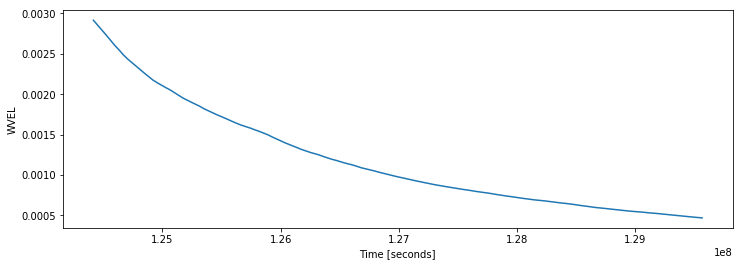

In [51]:
w45RMS.plot(figsize=(12,4))

In [117]:
for i in range(int(45*24)):
    fig, ax = plt.subplots(figsize=(15,11))
    fig.set_tight_layout(True)
    im = ax.pcolormesh(ds1H.XC.sel(XC=slice(3e5,7e5))*1e-3, ds1H.YC.sel(YC=slice(8e5,12e5))*1e-3, 
                      ds1H.WVEL[i,33].sel(YC=slice(8e5,12e5),XC=slice(3e5,7e5)), 
                      vmax=.01, vmin=-.01, cmap='RdBu_r', rasterized=True)
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(r'[m s$^{-1}$]', fontsize=15)
    plt.savefig(op.join(ddir,'Figures/02km_Wsnap/w1H_%04d.png' % i))
    plt.close()

In [72]:
ds1D = open_mdsdataset(op.join(ddir,'02km_postSpunUp'), 
                      grid_dir=op.join(ddir,'02km_grid'),
                      iters=range(ts+864,te+864,864), 
                      prefix=['MOMtave'], delta_t=dt
                      )
ds1D

/home/takaya/xmitgcm/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/takaya/xmitgcm/xmitgcm/mds_store.py:235: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


<xarray.Dataset>
Dimensions:  (XC: 500, XG: 500, YC: 1000, YG: 1000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, time: 360)
Coordinates:
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XG       (XG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * YG       (YG) >f4 0.0 2000.0 4000.0 6000.0 8000.0 10000.0 12000.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * Zu       (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 -16.1 ...
  * Zl       (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
    rA       (YC, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dxG      (YG, XC) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    dyG      (YC, XG) >f4 dask.array<shape=(1000, 500), chunksize=(1000, 500)>
    Depth    (YC, XC)

In [23]:
# grid = Grid(ds1D, periodic=['X'])
f0 = -1.1e-4
beta = 1.4e-11
# fC = f0 + beta*(ds1D.YC-10e5)
# fG = f0 + beta*(ds1D.YG-10e5)
g = 9.81
r0 = 1e3
alpha = 2e-4
# fC

In [77]:
pt = ds1D.THETA
N2 = alpha*g * (grid.diff(pt,'Z',boundary='extend',to='outer')
                / grid.diff(pt.Z,'Z',boundary='fill',to='outer')
                )
N2

<xarray.DataArray (time: 360, Zp1: 77, YC: 1000, XC: 500)>
dask.array<shape=(360, 77, 1000, 500), dtype=float32, chunksize=(1, 1, 1000, 500)>
Coordinates:
  * time     (time) float64 9.34e+07 9.348e+07 9.357e+07 9.366e+07 9.374e+07 ...
  * Zp1      (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 -13.26 ...
  * YC       (YC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...

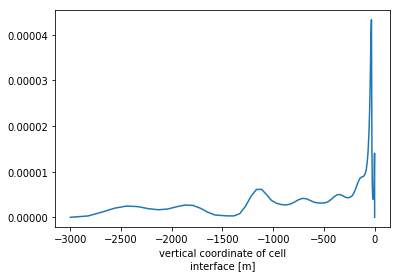

In [79]:
N2[:45].mean(['time','YC','XC']).plot()

In [61]:
ds1H.time.diff('time')/3600

<xarray.DataArray 'time' (time: 8639)>
array([1., 1., 1., ..., 1., 1., 1.])
Coordinates:
    iter     (time) int64 dask.array<shape=(8639,), chunksize=(1,)>
  * time     (time) float64 9.332e+07 9.332e+07 9.332e+07 9.333e+07 ...

In [17]:
grid = Grid(ds1H.sel(YC=slice(6e5,14e5),YG=slice(6e5,14e5)), periodic=['X'])
w15 = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(15*24),33]
Fe15 = grid.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(15*24),33]
Fe15

<xarray.DataArray 'mul-3e7d4bd7053e776418ecf859228f864d' (time: 360, YC: 400, XC: 500)>
dask.array<shape=(360, 400, 500), dtype=float32, chunksize=(1, 400, 500)>
Coordinates:
  * time     (time) float64 9.331e+07 9.332e+07 9.332e+07 9.332e+07 ...
    Zl       >f4 -312.09
  * YC       (YC) >f4 601000.0 603000.0 605000.0 607000.0 609000.0 611000.0 ...
  * XC       (XC) >f4 1000.0 3000.0 5000.0 7000.0 9000.0 11000.0 13000.0 ...

In [18]:
w15kf = xrft.dft(w15, dim=['XC'], detrend='constant')
Fe15kf = xrft.dft(Fe15, dim=['XC'], detrend='constant')
w15kf = xrft.dft(w15kf.chunk({'time':360,'YC':100}), dim=['time'], detrend='constant', window=True)
Fe15kf = xrft.dft(Fe15kf.chunk({'time':360,'YC':100}), dim=['time'], detrend='constant', window=True)
with ProgressBar():
    wFe15kf = (w15kf * np.conj(Fe15kf)).real.compute()
wFe15kf

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 13min  2.4s


<xarray.DataArray (freq_time: 360, YC: 400, freq_XC: 500)>
array([[[ 4.241761e-07, -4.651772e-08, ..., -9.344084e-08, -4.651772e-08],
        [-1.240064e-07, -1.438791e-08, ...,  1.990175e-07, -1.438791e-08],
        ...,
        [ 5.357492e-08,  1.255367e-07, ...,  7.860826e-09,  1.255367e-07],
        [ 2.434175e-08,  7.389846e-08, ..., -1.009897e-07,  7.389846e-08]],

       [[-5.738533e-08,  8.688293e-08, ...,  2.785753e-07, -1.032769e-07],
        [-1.548532e-07, -8.125492e-08, ...,  1.739971e-07,  3.275228e-08],
        ...,
        [-8.988271e-08,  3.858541e-09, ...,  4.605705e-08,  3.433964e-08],
        [ 7.786759e-09, -9.850430e-08, ..., -2.986722e-08,  9.191209e-08]],

       ...,

       [[-1.947264e-08,  3.323486e-08, ...,  2.515232e-07,  7.830349e-08],
        [-2.118613e-07,  4.268207e-08, ..., -7.906229e-08, -8.865636e-09],
        ...,
        [-1.069318e-07, -1.154359e-08, ...,  4.277669e-08, -9.426924e-08],
        [ 2.190404e-08,  1.455108e-09, ...,  8.145488e-08, -

(array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
 <a list of 7 Text yticklabel objects>)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


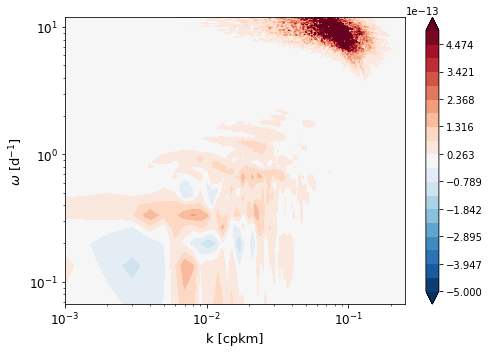

In [21]:
fig, ax = plt.subplots(figsize=(7,5))
fig.set_tight_layout(True)
im = ax.contourf(wFe15kf.freq_XC[251:]*1e3, wFe15kf.freq_time[181:]*86400, 
                wFe15kf[181:,251:].mean('YC')*wFe15kf.freq_XC[251:]*wFe15kf.freq_time[181:], 
                cmap='RdBu_r', levels=1e-11*np.linspace(-.05,.05,20), extend='both')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel(r'k [cpkm]', fontsize=13)
ax.set_ylabel(r'$\omega$ [d$^{-1}$]', fontsize=13)
fig.colorbar(im, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

In [23]:
w90 = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(90*24),33]
Fe90 = grid.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(90*24),33]
w90kf = xrft.dft(w90, dim=['XC'], detrend='constant')
Fe90kf = xrft.dft(Fe90, dim=['XC'], detrend='constant')
w90kf = xrft.dft(w90kf.chunk({'time':2160,'YC':100}), dim=['time'], detrend='constant', window=True)
Fe90kf = xrft.dft(Fe90kf.chunk({'time':2160,'YC':100}), dim=['time'], detrend='constant', window=True)
with ProgressBar():
    wFe90kf = (w90kf * np.conj(Fe90kf)).real.mean('YC').compute()
wFe90kf

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed |  1hr 38min 32.3s


<xarray.DataArray (freq_time: 2160, freq_XC: 500)>
array([[ 1.639700e-07, -1.414200e-08,  3.799734e-08, ...,  5.039636e-08,
         3.799734e-08, -1.414200e-08],
       [ 3.256403e-08,  4.208327e-08,  1.990982e-08, ...,  1.807165e-08,
         3.142971e-08, -4.447497e-08],
       [-1.890522e-08,  8.662159e-08,  3.524980e-08, ...,  6.220654e-08,
         1.613246e-08,  4.468764e-08],
       ...,
       [-4.207609e-08,  1.152838e-07, -3.425202e-08, ..., -1.141348e-08,
        -2.360653e-09,  4.432177e-08],
       [-1.890522e-08,  4.468764e-08,  1.613246e-08, ..., -5.489192e-09,
         3.524980e-08,  8.662159e-08],
       [ 3.256403e-08, -4.447497e-08,  3.142971e-08, ..., -4.881882e-09,
         1.990982e-08,  4.208327e-08]])
Coordinates:
  * freq_time          (freq_time) float64 -0.0001389 -0.0001388 -0.0001386 ...
  * freq_XC            (freq_XC) float64 -0.00025 -0.000249 -0.000248 ...
    freq_time_spacing  float64 1.286e-07

(array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
 <a list of 7 Text yticklabel objects>)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


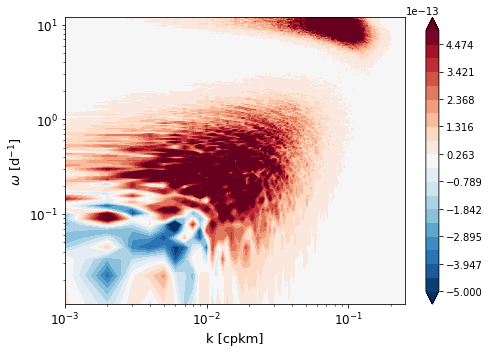

In [26]:
fig, ax = plt.subplots(figsize=(7,5))
fig.set_tight_layout(True)
im = ax.contourf(wFe90kf.freq_XC[251:]*1e3, wFe90kf.freq_time[1081:]*86400, 
                wFe90kf[1081:,251:]*wFe90kf.freq_XC[251:]*wFe90kf.freq_time[1081:], 
                cmap='RdBu_r', levels=1e-11*np.linspace(-.05,.05,20), extend='both')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel(r'k [cpkm]', fontsize=13)
ax.set_ylabel(r'$\omega$ [d$^{-1}$]', fontsize=13)
fig.colorbar(im, ax=ax)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

In [118]:
w45 = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(45*24),33]
Fe45 = grid.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(45*24),33]
w45kf = xrft.dft(w45, dim=['XC'], detrend='constant')
Fe45kf = xrft.dft(Fe45, dim=['XC'], detrend='constant')
w45kf = xrft.dft(w45kf.chunk({'time':1080,'YC':100}), dim=['time'], detrend='linear')
Fe45kf = xrft.dft(Fe45kf.chunk({'time':1080,'YC':100}), dim=['time'], detrend='linear')
with ProgressBar():
    wFe45kf = (w45kf * np.conj(Fe45kf)).real.mean('YC').compute()
    w245kf = (w45kf * np.conj(w45kf)).real.mean('YC').compute()
wFe45kf

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed |  3min 10.6s
[########################################] | 100% Completed |  1min 27.3s


<xarray.DataArray (freq_time: 1080, freq_XC: 500)>
array([[ 7.820159e-09, -1.111554e-07,  3.647062e-08, ...,  8.808522e-08,
         3.647062e-08, -1.111554e-07],
       [-1.386535e-07,  1.472778e-07,  1.035424e-07, ...,  9.956109e-09,
        -4.757731e-08,  9.190850e-10],
       [-3.096632e-08,  5.413965e-08,  1.339754e-07, ...,  6.051569e-08,
        -2.662586e-07,  1.394651e-07],
       ...,
       [-2.214581e-09, -5.893210e-09,  1.855872e-07, ..., -8.507787e-09,
         3.502776e-08,  1.487164e-07],
       [-3.096632e-08,  1.394651e-07, -2.662586e-07, ..., -7.924740e-08,
         1.339754e-07,  5.413965e-08],
       [-1.386535e-07,  9.190850e-10, -4.757731e-08, ..., -4.288514e-08,
         1.035424e-07,  1.472778e-07]])
Coordinates:
  * freq_time          (freq_time) float64 -0.0001389 -0.0001386 -0.0001384 ...
  * freq_XC            (freq_XC) float64 -0.00025 -0.000249 -0.000248 ...
    freq_time_spacing  float64 2.572e-07

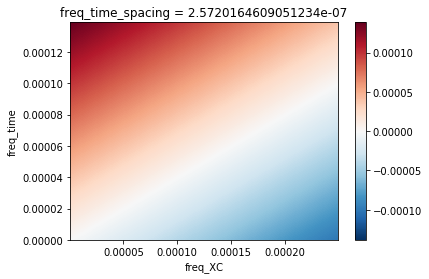

In [71]:
(w245kf.freq_time[541:]-.4*w245kf.freq_XC[251:]).plot()
# w245kf.freq_time[541:]

In [85]:
f0 = -1.1e-4
N233 = N2[:45,33].mean(['time','YC','XC']).compute()
N233

<xarray.DataArray ()>
array(4.691299e-06, dtype=float32)
Coordinates:
    Zp1      >f4 -312.09

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


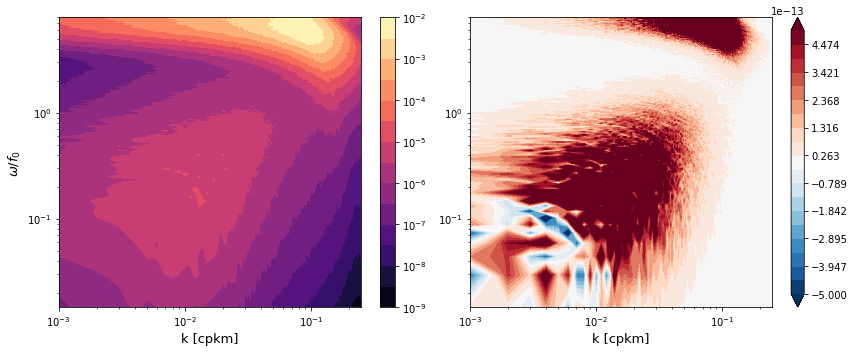

In [119]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(12,5))
fig.set_tight_layout(True)
im1 = ax1.contourf(w245kf.freq_XC[251:]*1e3, 
                  (w245kf.freq_time[541:])*np.abs(f0/(2*np.pi))**-1, 
                  (w245kf*86400)[541:,251:]*w245kf.freq_XC[251:]*w245kf.freq_time[541:], 
                  cmap='magma', levels=np.logspace(-9,-2,15), norm=clr.LogNorm())
im2 = ax2.contourf(wFe45kf.freq_XC[251:]*1e3, wFe45kf.freq_time[541:]*np.abs(f0/(2*np.pi))**-1, 
                  wFe45kf[541:,251:]*wFe45kf.freq_XC[251:]*wFe45kf.freq_time[541:], 
                  cmap='RdBu_r', levels=1e-11*np.linspace(-.05,.05,20), extend='both')
ax1.set_xscale('log')
ax1.set_yscale('log')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax1.set_xlabel(r'k [cpkm]', fontsize=13)
ax2.set_xlabel(r'k [cpkm]', fontsize=13)
ax1.set_ylabel(r'$\omega/f_0$', fontsize=13)
fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)

In [41]:
wz45 = ds1H.WVEL.sel(YC=slice(6e5,14e5))[:int(45*24)]
Fez45 = grid.interp(ds1H.TRAC03.sel(YC=slice(6e5,14e5)),'Z',boundary='fill')[:int(45*24)]
wz45k = xrft.dft(wz45, dim=['XC'], detrend='constant')
Fez45k = xrft.dft(Fez45, dim=['XC'], detrend='constant')
with ProgressBar():
    wFe45k = (wz45k * np.conj(Fez45k)).real.mean(['time','YC']).compute()
    w245k = (wz45k * np.conj(wz45k)).real.mean(['time','YC']).compute()
wFe45k

/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:
/home/takaya/xrft/xrft/xrft.py:272: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  elif d in da:


[########################################] | 100% Completed | 14min 59.2s
[########################################] | 100% Completed |  8min 52.0s


<xarray.DataArray (Zl: 76, freq_XC: 500)>
array([[ 1.000419e-15,  1.822773e-15, -1.315720e-15, ...,  2.884571e-15,
        -1.315720e-15,  1.822773e-15],
       [-9.403499e-13, -9.442916e-13, -1.023114e-12, ..., -1.063550e-12,
        -1.023114e-12, -9.442916e-13],
       [-2.014297e-12, -2.031056e-12, -2.196439e-12, ..., -2.282053e-12,
        -2.196439e-12, -2.031056e-12],
       ...,
       [ 1.190901e-10,  1.171354e-10,  1.201151e-10, ...,  1.176910e-10,
         1.201151e-10,  1.171354e-10],
       [ 9.896651e-11,  9.798137e-11,  9.778960e-11, ...,  9.814181e-11,
         9.778960e-11,  9.798137e-11],
       [ 2.470493e-11,  2.272154e-11,  2.448315e-11, ...,  2.617564e-11,
         2.448315e-11,  2.272154e-11]])
Coordinates:
  * Zl               (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 ...
  * freq_XC          (freq_XC) float64 -0.00025 -0.000249 -0.000248 ...
    freq_XC_spacing  float64 1e-06

(array([-3000., -2500., -2000., -1500., -1000.,  -500.,     0.]),
 <a list of 7 Text yticklabel objects>)

/home/takaya/miniconda3/envs/uptodate/lib/python3.6/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


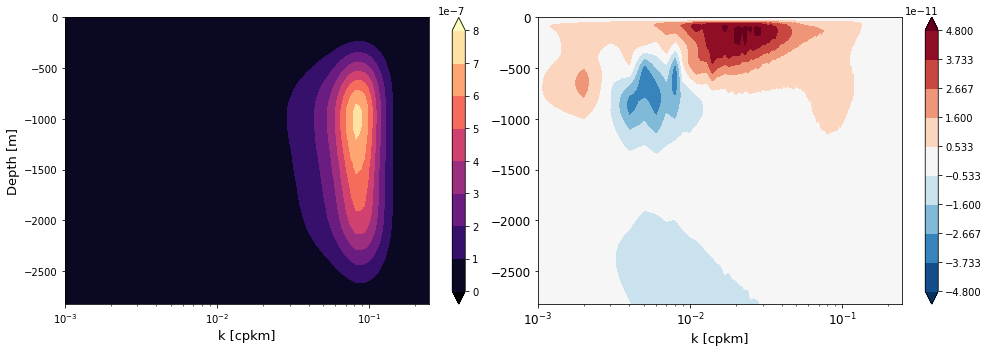

In [44]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(14,5))
fig.set_tight_layout(True)
im1 = ax1.contourf(w245k.freq_XC[251:]*1e3, w245k.Zl, 
                  w245k[:,251:]*w245k.freq_XC[251:], 
                  cmap='magma', extend='both')
im2 = ax2.contourf(wFe45k.freq_XC[251:]*1e3, wFe45k.Zl, 
                  wFe45k[:,251:]*wFe45k.freq_XC[251:], 
                  cmap='RdBu_r', levels=1e-11*np.linspace(-4.8,4.8,10), extend='both')
ax2.set_xscale('log')
ax1.set_xscale('log')
ax2.set_xlabel(r'k [cpkm]', fontsize=13)
ax1.set_xlabel(r'k [cpkm]', fontsize=13)
ax1.set_ylabel(r'Depth [m]', fontsize=13)
fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

In [36]:
4*360*86400/4e1

3110400.0

In [37]:
15*86400/40

32400.0